# Data Assessment & Analytics for Water Right and Time Series Water Use
Notes:
- change os directory location
- be aware of the number of provdied native source data files
- beware of of what data is available

In [1]:
# Needed Libraries / Modules

# ---- working with data ----
import os  # native operating system interaction
import numpy as np  # mathematical array manipulation
import pandas as pd  # data structure and data analysis
import geopandas as gpd  # geo-data structure and data analysis

# ---- visualization ----
import geoplot as gplt  # for plotting maps and geo-data
import geoplot.crs as gcrs  #used to pull in webdata related to maps and geo-data
import missingno as msno # creates a matrix chart to show missing values
import plotly.express as px
import plotly.graph_objects as go  # for subplot creation
from plotly.subplots import make_subplots  # for subplot creation
import matplotlib.pyplot as mplt  # use with gplt to save fig to pdf

# ---- cleanup ----
import re # string regular expression manipulation
from datetime import datetime # date and time manipulation
pd.set_option('display.max_columns', 999)  # How to display all columns of a Pandas DataFrame in Jupyter Notebook
pd.set_option('display.float_format', lambda x: '%.5f' % x) # suppress scientific notation in Pandas

In [2]:
# ---- working directory ----
workingDirString = os.getcwd() # set working directory folder string here
os.chdir(workingDirString)
print(f'The working Directory is:', workingDirString)

The working Directory is: C:\Users\rjame\Documents\WSWC Documents\MappingStatesDataToWaDE2.0\Oklahoma\WaterAllocation_WaterUse


In [3]:
# ---- where to find input files ----
InputFolderString = "G:/Shared drives/WaDE Data/Oklahoma/WaterAllocation_WaterUse"  # set this to where input files are located

In [4]:
# Native Input Data
#################################################################
# ---- This needs to be custom per state ----

# Data Set 1: Permitted_GW_Wells
dfin1 = pd.read_csv(InputFolderString + '/RawinputData/water_right/Permitted_GW_Wells.zip')

# Data Set 2: Permitted_SW_Diversions
dfin2 = pd.read_csv(InputFolderString + '/RawinputData/water_right/Permitted_SW_Diversions.zip')

# Data Set 3: Permitted_Areas_of_Use
dfin3 = pd.read_csv(InputFolderString + '/RawinputData/water_right/Permitted_Areas_of_Use.zip')

# Data Set 4: Permitted_Dedicated_Lands
dfin4 = pd.read_csv(InputFolderString + '/RawinputData/water_right/Permitted_Dedicated_Lands.zip')

# Data Set 5: Groundwater Use 2000-2020
dfin5 = pd.read_csv(InputFolderString + '/RawinputData/water_use/Groundwater Use 2000-2020.zip')

# Data Set 6: Surface Water Use 2000-2020
dfin6 = pd.read_csv(InputFolderString + '/RawinputData/water_use/Surface Water Use 2000-2020.zip')

In [5]:
# WaDE Processed Input Data
#################################################################

dfm = pd.read_csv(InputFolderString + "/ProcessedInputData/methods.csv", encoding = "ISO-8859-1").replace(np.nan, "")

dfv = pd.read_csv(InputFolderString + "/ProcessedInputData/variables.csv", encoding = "ISO-8859-1").replace(np.nan, "")

dfo = pd.read_csv(InputFolderString + "/ProcessedInputData/organizations.csv", encoding = "ISO-8859-1").replace(np.nan, "")

dfws = pd.read_csv(InputFolderString + "/ProcessedInputData/watersources.csv").replace(np.nan, "")
dfwspurge = pd.read_csv(InputFolderString + "/ProcessedInputData/watersources_missing.csv").replace(np.nan, "")

dfs = pd.read_csv(InputFolderString + "/ProcessedInputData/sites.csv").replace(np.nan, "")
dfspurge = pd.read_csv(InputFolderString + "/ProcessedInputData/sites_missing.csv").replace(np.nan, "")

dfaa = pd.read_csv(InputFolderString + "/ProcessedInputData/waterallocations.csv").replace(np.nan, "")
dfaapurge = pd.read_csv(InputFolderString + "/ProcessedInputData/waterallocations_missing.csv").replace(np.nan, "")

dfsa = pd.read_csv(InputFolderString + "/ProcessedInputData/sitespecificamounts.csv").replace(np.nan, "")
dfsapurge = pd.read_csv(InputFolderString + "/ProcessedInputData/sitespecificamounts_missing.csv").replace(np.nan, "")

C:\Users\rjame\AppData\Local\Temp\ipykernel_8484\2624352394.py:13: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs = pd.read_csv(InputFolderString + "/ProcessedInputData/sites.csv").replace(np.nan, "")
C:\Users\rjame\AppData\Local\Temp\ipykernel_8484\2624352394.py:20: DtypeWarning: Columns (27) have mixed types. Specify dtype option on import or set low_memory=False.
  dfsapurge = pd.read_csv(InputFolderString + "/ProcessedInputData/sitespecificamounts_missing.csv").replace(np.nan, "")


# Water Source Info (watersources.csv)

In [6]:
print(len(dfws))
dfws.head(1)

2


,WaterSourceUUID,Geometry,GNISFeatureNameCV,WaterQualityIndicatorCV,WaterSourceName,WaterSourceNativeID,WaterSourceTypeCV
0,OKwrwu_WwadeId1,,,Fresh,WaDE Blank,wadeId1,Groundwater


<Axes: >

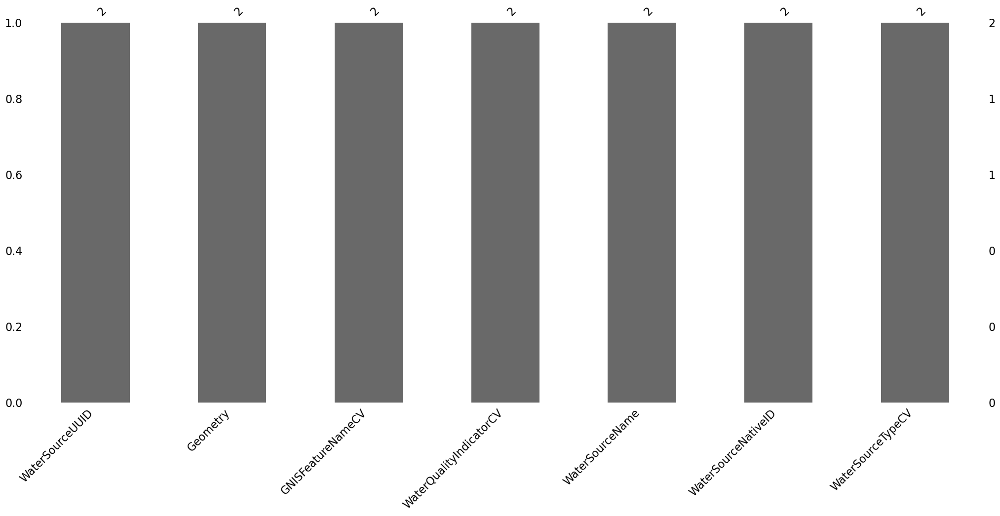

In [7]:
# Check what columns contain missing information.
msno.bar(dfws)

In [8]:
# Unique values for 'WaterSourceTypeCV'
for x in dfws['WaterSourceTypeCV'].sort_values().unique():
    print(f'"' + x + '",')

"Groundwater",
"Surface Water",


# Site Info (sites.csv)

In [9]:
print(len(dfs))
dfs.head(1)

48786


,SiteUUID,RegulatoryOverlayUUIDs,WaterSourceUUIDs,CoordinateAccuracy,CoordinateMethodCV,County,EPSGCodeCV,Geometry,GNISCodeCV,HUC12,HUC8,Latitude,Longitude,NHDNetworkStatusCV,NHDProductCV,PODorPOUSite,SiteName,SiteNativeID,SitePoint,SiteTypeCV,StateCV,USGSSiteID
0,OKwrwu_Spod10,,OKwrwu_WwadeId1,WaDE Blank,WaDE Blank,Woodward,4326,,,111003010103,11100301.00000,36.27990,-99.38635,,,POD,WaDE Blank,pod10,,WaDE Blank,OK,


<Axes: >

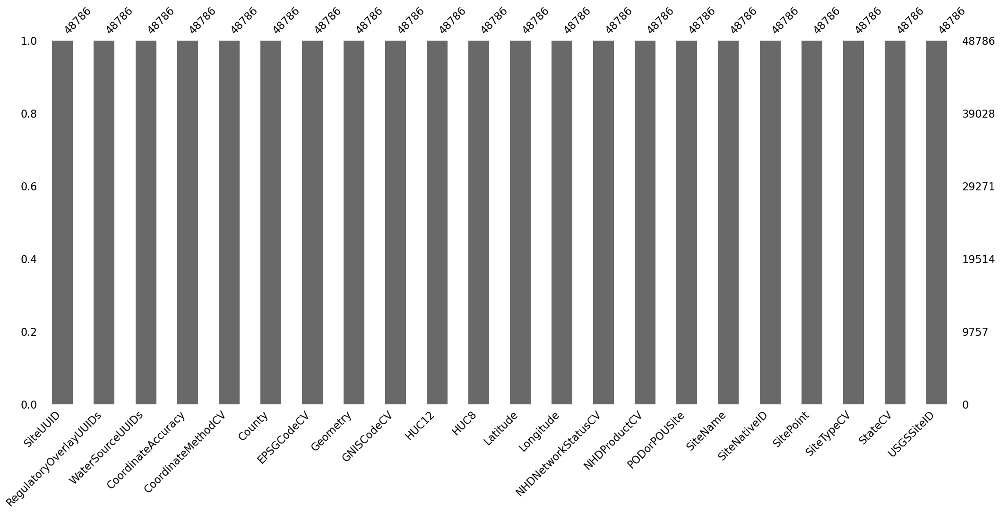

In [10]:
# Check what columns contain missing information.
msno.bar(dfs)

In [11]:
# Unique values for 'CoordinateMethodCV'
for x in dfs['CoordinateMethodCV'].sort_values().unique():
    print(f'"' + x + '",')

"WaDE Blank",


In [12]:
# Unique values for 'SiteTypeCV'
for x in dfs['SiteTypeCV'].sort_values().unique():
    print(f'"' + x + '",')

"WaDE Blank",


# Allocation Amount Info (waterallocations.csv)

In [13]:
print(len(dfaa))
dfaa.head(1)

12972


,AllocationUUID,MethodUUID,OrganizationUUID,SiteUUID,VariableSpecificUUID,AllocationApplicationDate,AllocationAssociatedConsumptiveUseSiteIDs,AllocationAssociatedWithdrawalSiteIDs,AllocationBasisCV,AllocationChangeApplicationIndicator,AllocationCommunityWaterSupplySystem,AllocationCropDutyAmount,AllocationExpirationDate,AllocationFlow_CFS,AllocationLegalStatusCV,AllocationNativeID,AllocationOwner,AllocationPriorityDate,AllocationSDWISIdentifierCV,AllocationTimeframeEnd,AllocationTimeframeStart,AllocationTypeCV,AllocationVolume_AF,BeneficialUseCategory,CommunityWaterSupplySystem,CropTypeCV,CustomerTypeCV,DataPublicationDate,DataPublicationDOI,ExemptOfVolumeFlowPriority,GeneratedPowerCapacityMW,IrrigatedAcreage,IrrigationMethodCV,LegacyAllocationIDs,OwnerClassificationCV,PopulationServed,PowerType,PrimaryBeneficialUseCategory,WaterAllocationNativeURL
0,OKwrwu_WR18960001,OKwrwu_M1,OKwrwu_OR1,"OKwrwu_Spou20416,OKwrwu_Spod20417",OKwrwu_V1,,,,WaDE Blank,,,,,0.00000,Active,18960001,"Labrue, Percy",1896-01-01,,,,Permit,52.00000,Irrigation,,,,08/06/2024,,0,,0.00000,,,Private,,,Agriculture Irrigation,


<Axes: >

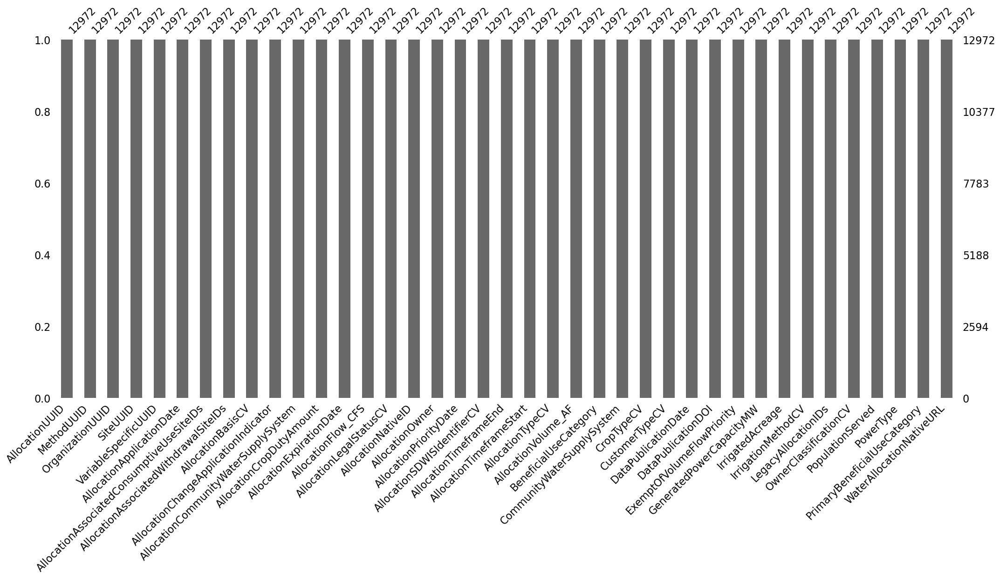

In [14]:
# Check what columns contain missing information.
msno.bar(dfaa)

In [15]:
# Unique values for 'AllocationBasisCV'
for x in dfaa['AllocationBasisCV'].sort_values().unique():
    print(f'"' + str(x) + '",')

"WaDE Blank",


In [16]:
# Unique values for 'AllocationTypeCV'
for x in dfaa['AllocationTypeCV'].sort_values().unique():
    print(f'"' + x + '",')

"Pending Split",
"Permit",


In [17]:
# Unique values for 'AllocationLegalStatusCV'
for x in dfaa['AllocationLegalStatusCV'].sort_values().unique():
    print(f'"' + x + '",')

"Active",
"Pending",


In [18]:
# Unique values for 'BeneficialUseCategory'
uniqueList = list(set([i.strip() for i in ','.join(dfaa['BeneficialUseCategory'].astype(str)).split(',')]))
uniqueList.sort()
uniqueList

['Agriculture',
 'Commercial',
 'Industrial',
 'Irrigation',
 'Mining',
 'Other',
 'Power',
 'Public Supply',
 'Recreation Fish & Wildlife']

In [19]:
# Unique values for 'OwnerClassificationCV'
for x in dfaa['OwnerClassificationCV'].sort_values().unique():
    print(f'"' + x + '",')

"Fish and Wildlife Service (USFWS)",
"Forest Service (USFS)",
"Military",
"Native American",
"Private",
"United States of America",
"Unspecified",


# Site-Specific Amount Info (sitespecificamounts.csv)

In [20]:
print(len(dfsa))
dfsa.head(1)

421180


,MethodUUID,OrganizationUUID,SiteUUID,VariableSpecificUUID,WaterSourceUUID,Amount,AllocationCropDutyAmount,AssociatedNativeAllocationIDs,BeneficialUseCategory,CommunityWaterSupplySystem,CropTypeCV,CustomerTypeCV,DataPublicationDate,DataPublicationDOI,Geometry,IrrigatedAcreage,IrrigationMethodCV,PopulationServed,PowerGeneratedGWh,PowerType,PrimaryUseCategory,ReportYearCV,SDWISIdentifier,TimeframeEnd,TimeframeStart
0,OKwrwu_M1,OKwrwu_OR1,OKwrwu_Spod59530,OKwrwu_V2,OKwrwu_WwadeId1,285.00000,,20090520,Irrigation,,,,08/07/2024,,,,,,,,Irrigation,2010,,2010-12-31,2010-01-01


<Axes: >

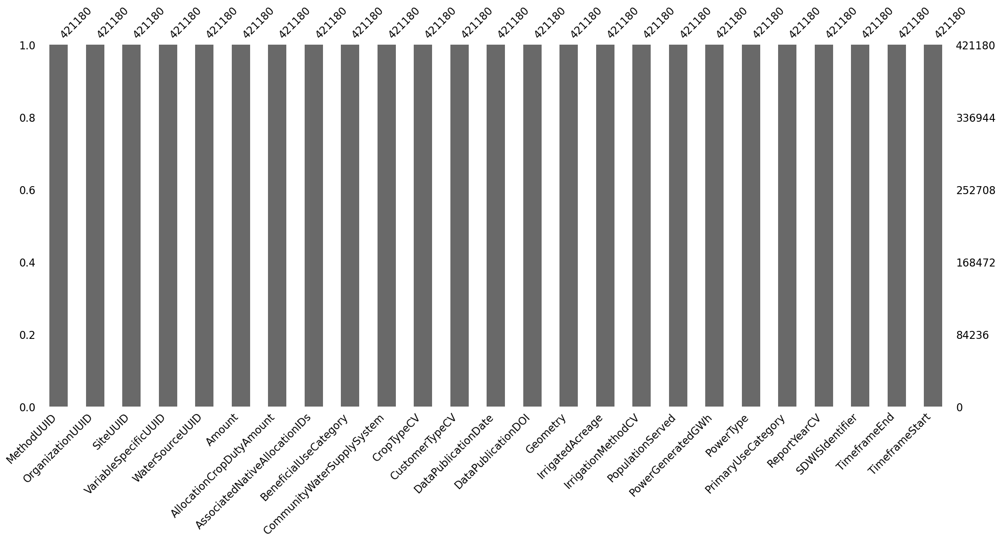

In [21]:
# Check what columns contain missing information.
msno.bar(dfsa)

In [22]:
# Unique values for 'BeneficialUseCategory'
uniqueList = list(set([i.strip() for i in ','.join(dfsa['BeneficialUseCategory'].astype(str)).split(',')]))
uniqueList.sort()
uniqueList

['Agriculture',
 'Commercial',
 'Industrial',
 'Irrigation',
 'Mining',
 'Other',
 'Power',
 'Public Supply',
 'Recreation Fish & Wildlife']

In [23]:
# Unique values for 'PrimaryUseCategory'
uniqueList = list(set([i.strip() for i in ','.join(dfsa['PrimaryUseCategory'].astype(str)).split(',')]))
uniqueList.sort()
uniqueList

['Agriculture',
 'Commercial',
 'Industrial',
 'Irrigation',
 'Mining',
 'Other',
 'Power',
 'Public Supply',
 'Recreation Fish & Wildlife']

In [24]:
# Unique values for 'in_CropTypeCV'
for x in dfsa['CropTypeCV'].sort_values().unique():
    print(f'"' + x + '",')

"",


In [25]:
# Unique values for 'in_CustomerTypeCV'
for x in dfsa['CustomerTypeCV'].astype(str).sort_values().unique():
    print(f'"' + x + '",')

"",


In [26]:
# Unique values for 'in_PopulationServed'
for x in dfsa['PopulationServed'].astype(str).sort_values().unique():
    print(f'"' + x + '",')

"",


In [27]:
# Unique values for 'in_ReportYearCV'
for x in dfsa['ReportYearCV'].astype(str).sort_values().unique():
    print(f'"' + x + '",')

"2000",
"2001",
"2002",
"2003",
"2004",
"2005",
"2006",
"2007",
"2008",
"2009",
"2010",
"2011",
"2012",
"2013",
"2014",
"2015",
"2016",
"2017",
"2018",
"2019",
"2020",


## Markdown Table Creation

In [28]:
# method.csv
try:
  dftmp = dfm.loc[[0]].drop(['MethodDescription'], axis=1).copy().to_markdown()
except:
  dftmp = dfm.drop(['MethodDescription'], axis=1).copy().to_markdown()
print(dftmp)

|    | MethodUUID   | ApplicableResourceTypeCV      | DataConfidenceValue   | DataCoverageValue   | DataQualityValueCV   | MethodName                   | MethodNEMILink                             | MethodTypeCV    | WaDEDataMappingUrl   | Unnamed: 10                                                                              |
|---:|:-------------|:------------------------------|:----------------------|:--------------------|:---------------------|:-----------------------------|:-------------------------------------------|:----------------|:---------------------|:-----------------------------------------------------------------------------------------|
|  0 | OKwrwu_M1    | Surface Water and Groundwater |                       |                     |                      | Oklahoma Water Rights Method | https://www.owrb.ok.gov/wateruse/index.php | Legal Processes |                      | https://github.com/WSWCWaterDataExchange/MappingStatesDataToWaDE2.0/tree/master/Oklahoma |


In [29]:
# variable.csv
try:
  dftmp = dfv.loc[[0]].copy().to_markdown()
except:
  dftmp = dfv.copy().to_markdown()
print(dftmp)

|    | VariableSpecificUUID   |   AggregationInterval | AggregationIntervalUnitCV   | AggregationStatisticCV   | AmountUnitCV   | MaximumAmountUnitCV   |   ReportYearStartMonth | ReportYearTypeCV   | VariableCV   | VariableSpecificCV   |
|---:|:-----------------------|----------------------:|:----------------------------|:-------------------------|:---------------|:----------------------|-----------------------:|:-------------------|:-------------|:---------------------|
|  0 | OKwrwu_V1              |                     1 | Year                        | Average                  | AFY            | AFY                   |                     10 | WaterYear          | Allocation   | Allocation           |


In [30]:
# organizations.csv
try:
  dftmp = dfo.loc[[0]].copy().to_markdown()
except:
  dftmp = dfo.copy().to_markdown()
print(dftmp)

|    | OrganizationUUID   | OrganizationContactEmail   | OrganizationContactName   | OrganizationName               | OrganizationPhoneNumber   | OrganizationPurview                                               | OrganizationWebsite      | State   |
|---:|:-------------------|:---------------------------|:--------------------------|:-------------------------------|:--------------------------|:------------------------------------------------------------------|:-------------------------|:--------|
|  0 | OKwrwu_OR1         | david.hamilton@owrb.ok.gov | David Hamilton            | Oklahoma Water Resources Board | 303-866-3581              | OWRB produces and maintains datasets related to water in Oklahoma | https://www.owrb.ok.gov/ | OK      |


In [31]:
# watersources.csv
try:
  dftmp = dfws.loc[[0]].copy().to_markdown()
except:
  dftmp = dfws.copy().to_markdown()
print(dftmp)

|    | WaterSourceUUID   | Geometry   | GNISFeatureNameCV   | WaterQualityIndicatorCV   | WaterSourceName   | WaterSourceNativeID   | WaterSourceTypeCV   |
|---:|:------------------|:-----------|:--------------------|:--------------------------|:------------------|:----------------------|:--------------------|
|  0 | OKwrwu_WwadeId1   |            |                     | Fresh                     | WaDE Blank        | wadeId1               | Groundwater         |


In [32]:
# sites.csv
try:
  dftmp = dfs.loc[[0]].drop(['Geometry'], axis=1).copy().to_markdown()
except:
  dftmp = dfs.drop(['Geometry'], axis=1).copy().to_markdown()
print(dftmp)

|    | SiteUUID      | RegulatoryOverlayUUIDs   | WaterSourceUUIDs   | CoordinateAccuracy   | CoordinateMethodCV   | County   |   EPSGCodeCV | GNISCodeCV   |        HUC12 |        HUC8 |   Latitude |   Longitude | NHDNetworkStatusCV   | NHDProductCV   | PODorPOUSite   | SiteName   | SiteNativeID   | SitePoint   | SiteTypeCV   | StateCV   | USGSSiteID   |
|---:|:--------------|:-------------------------|:-------------------|:---------------------|:---------------------|:---------|-------------:|:-------------|-------------:|------------:|-----------:|------------:|:---------------------|:---------------|:---------------|:-----------|:---------------|:------------|:-------------|:----------|:-------------|
|  0 | OKwrwu_Spod10 |                          | OKwrwu_WwadeId1    | WaDE Blank           | WaDE Blank           | Woodward |         4326 |              | 111003010103 | 1.11003e+07 |    36.2799 |    -99.3864 |                      |                | POD            | WaDE Blank | po

In [33]:
# waterallocations.csv
try:
  dftmp = dfaa.loc[[0]].copy().to_markdown()
except:
  dftmp = dfaa.copy().to_markdown()
print(dftmp)

|    | AllocationUUID    | MethodUUID   | OrganizationUUID   | SiteUUID                          | VariableSpecificUUID   | AllocationApplicationDate   | AllocationAssociatedConsumptiveUseSiteIDs   | AllocationAssociatedWithdrawalSiteIDs   | AllocationBasisCV   | AllocationChangeApplicationIndicator   | AllocationCommunityWaterSupplySystem   | AllocationCropDutyAmount   | AllocationExpirationDate   |   AllocationFlow_CFS | AllocationLegalStatusCV   |   AllocationNativeID | AllocationOwner   | AllocationPriorityDate   | AllocationSDWISIdentifierCV   | AllocationTimeframeEnd   | AllocationTimeframeStart   | AllocationTypeCV   |   AllocationVolume_AF | BeneficialUseCategory   | CommunityWaterSupplySystem   | CropTypeCV   | CustomerTypeCV   | DataPublicationDate   | DataPublicationDOI   |   ExemptOfVolumeFlowPriority | GeneratedPowerCapacityMW   |   IrrigatedAcreage | IrrigationMethodCV   | LegacyAllocationIDs   | OwnerClassificationCV   | PopulationServed   | PowerType   | PrimaryBenefici

In [34]:
# sitespecificamounts.csv
try:
  dftmp = dfsa.loc[[0]].copy().to_markdown()
except:
  dftmp = dfsa.copy().to_markdown()
print(dftmp)

|    | MethodUUID   | OrganizationUUID   | SiteUUID         | VariableSpecificUUID   | WaterSourceUUID   |   Amount | AllocationCropDutyAmount   |   AssociatedNativeAllocationIDs | BeneficialUseCategory   | CommunityWaterSupplySystem   | CropTypeCV   | CustomerTypeCV   | DataPublicationDate   | DataPublicationDOI   | Geometry   | IrrigatedAcreage   | IrrigationMethodCV   | PopulationServed   | PowerGeneratedGWh   | PowerType   | PrimaryUseCategory   |   ReportYearCV | SDWISIdentifier   | TimeframeEnd   | TimeframeStart   |
|---:|:-------------|:-------------------|:-----------------|:-----------------------|:------------------|---------:|:---------------------------|--------------------------------:|:------------------------|:-----------------------------|:-------------|:-----------------|:----------------------|:---------------------|:-----------|:-------------------|:---------------------|:-------------------|:--------------------|:------------|:---------------------|---------------:

## Num of Record Summary

In [35]:
# Num of entries of source data
print(f"Num of Source #1 Entries (rows): ", "|", len(dfin1))
print(f"Num of Source #2 Entries (rows): ", "|", len(dfin2))
print(f"Num of Source #3 Entries (rows): ", "|", len(dfin3))
print(f"Num of Source #4 Entries (rows): ", "|", len(dfin4))
print(f"Num of Source #4 Entries (rows): ", "|", len(dfin5))
print(f"Num of Source #4 Entries (rows): ", "|", len(dfin6))

Num of Source #1 Entries (rows):  | 21484
Num of Source #2 Entries (rows):  | 3200
Num of Source #3 Entries (rows):  | 4211
Num of Source #4 Entries (rows):  | 20777
Num of Source #4 Entries (rows):  | 84972
Num of Source #4 Entries (rows):  | 23599


In [36]:
# Num of entries compiled into WaDE
podString =  len(dfs[dfs['PODorPOUSite'] == 'POD'])
pouString=  len(dfs[dfs['PODorPOUSite'] == 'POU'])
aaString = len(dfaa)
saString = len(dfsa)
print("Dataset  | Num of Identified PODs | Num of Identified POUs | Num of Identified Water Right Records | Num of Identified Water Use Records")
print("**Compiled WaDE Data** |", podString, "|", pouString, "|", aaString, "|", saString)

Dataset  | Num of Identified PODs | Num of Identified POUs | Num of Identified Water Right Records | Num of Identified Water Use Records
**Compiled WaDE Data** | 24362 | 24424 | 12972 | 421180


## Why Removed Records Summary

In [37]:
print("---- Reasons why records were removed from water source info ----")
if len(dfwspurge) != 0:
    print(dfwspurge['ReasonRemoved'].value_counts().astype(str) + " | removed from watersources.csv input")
else:
    print("...nothing removed.")

---- Reasons why records were removed from water source info ----
...nothing removed.


In [38]:
print(" ---- Reasons why records were removed from site info ---- ")
if len(dfspurge) != 0:
    print(dfspurge['ReasonRemoved'].value_counts().astype(str) + " | removed from sites.csv input")
else:
    print("...nothing removed.")

 ---- Reasons why records were removed from site info ---- 
ReasonRemoved
Unused Site Record                      468 | removed from sites.csv input
Incomplete or bad entry for Latitude    117 | removed from sites.csv input
Name: count, dtype: object


In [39]:
print(" ---- Reasons why records were removed from allocation amount info ---- ")
if len(dfaapurge) != 0:
    print(dfaapurge['ReasonRemoved'].value_counts().astype(str) + " | removed from waterallocations.csv input")
else:
    print("...nothing removed.")

 ---- Reasons why records were removed from allocation amount info ---- 
ReasonRemoved
Incomplete or bad entry for AllocationPriorityDate    341 | removed from waterallocations.csv input
Incomplete or bad entry for SiteUUID                    1 | removed from waterallocations.csv input
Name: count, dtype: object


In [40]:
print(" ---- Reasons why records were removed from site specific amounts  info ---- ")
if len(dfsapurge) != 0:
    print(dfsapurge['ReasonRemoved'].value_counts().astype(str) + " | removed from sitespecificamounts.csv input")
else:
    print("...nothing removed.")

 ---- Reasons why records were removed from site specific amounts  info ---- 
ReasonRemoved
Negative, blank, or 0 Amount values                     3261703 | removed from sitespecificamounts.csv...
Incomplete or bad entry for SiteUUID                    3112 | removed from sitespecificamounts.csv input
Unused WR & Site Record                                 1139 | removed from sitespecificamounts.csv input
Not Unique combination of SiteSpecificAmounts record      44 | removed from sitespecificamounts.csv input
Name: count, dtype: object


## Figures

In [41]:
# ---- merge watersource.csv to sites.csv ----

# explode site.csv on WaterSourceUUIDs
dfstemp = dfs.copy()
dfstemp = dfstemp.assign(WaterSourceUUIDs=dfstemp['WaterSourceUUIDs'].str.split(',')).explode('WaterSourceUUIDs').reset_index(drop=True)

# merge
dfstemp_ws = pd.merge(dfstemp, dfws[['WaterSourceUUID', 'WaterSourceTypeCV']], left_on='WaterSourceUUIDs', right_on='WaterSourceUUID', how='left')

# groupby site-watersource.csv via SiteUUID
dfstemp_ws = dfstemp_ws.groupby('SiteUUID').agg(lambda x: ','.join([str(elem) for elem in (list(set(x))) if elem != ""])).replace(np.nan, "").reset_index()

print(len(dfstemp_ws))
dfstemp_ws.head(1)

48786


,SiteUUID,RegulatoryOverlayUUIDs,WaterSourceUUIDs,CoordinateAccuracy,CoordinateMethodCV,County,EPSGCodeCV,Geometry,GNISCodeCV,HUC12,HUC8,Latitude,Longitude,NHDNetworkStatusCV,NHDProductCV,PODorPOUSite,SiteName,SiteNativeID,SitePoint,SiteTypeCV,StateCV,USGSSiteID,WaterSourceUUID,WaterSourceTypeCV
0,OKwrwu_Spod10,,OKwrwu_WwadeId1,WaDE Blank,WaDE Blank,Woodward,4326,,,111003010103,11100301.0,36.2799005,-99.386354,,,POD,WaDE Blank,pod10,,WaDE Blank,OK,,OKwrwu_WwadeId1,Groundwater


In [42]:
# ---- Histogram: Num of POD sites vs POU sites ----
print(dfstemp_ws.PODorPOUSite.value_counts())

fig = px.histogram(dfstemp_ws, x="PODorPOUSite", text_auto=True)
fig.update_layout(bargap=0.2,
                  title="Histogram of PODorPOUSite Entries in sites.csv",
                  xaxis_title="PODorPOUSite Value",
                  yaxis_title="# of entries",
                  #legend_title="Legend Title",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('figures/PODorPOUSite.png', engine="kaleido")

PODorPOUSite
POU    24424
POD    24362
Name: count, dtype: int64


In [43]:
# ---- Histogram: Num of sites via WatersourceTypeCV ----
print(dfstemp_ws.WaterSourceTypeCV.value_counts())

fig = px.histogram(dfstemp_ws, x="WaterSourceTypeCV", text_auto=True)
fig.update_layout(bargap=0.2,
                  title="Histogram of WaterSourceTypeCV Entries in sites.csv",
                  xaxis_title="WaterSourceTypeCV Value",
                  yaxis_title="# of entries",
                  #legend_title="Legend Title",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('figures/WaterSourceTypeCV.png', engine="kaleido")

WaterSourceTypeCV
Groundwater      41389
Surface Water     7397
Name: count, dtype: int64


In [44]:
# ---- Histogram: Distribution of PrimaryBeneficialUseCategory WaDE Values ----
print(dfaa.PrimaryBeneficialUseCategory.value_counts())

fig = px.histogram(dfaa, x="PrimaryBeneficialUseCategory", text_auto=True)
fig.update_layout(bargap=0.2,
                  title="Histogram of WaDE PrimaryBeneficialUseCategory Entries in waterallocations.csv",
                  xaxis_title="PrimaryBeneficialUseCategory Value",
                  yaxis_title="# of entries",
                  #legend_title="Legend Title",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('figures/PrimaryBeneficialUseCategory.png', engine="kaleido")

PrimaryBeneficialUseCategory
Agriculture Irrigation    10076
Municipal Irrigation       1665
Mining                      421
Recreation                  379
Commercial/Industrial       377
Hydroelectric                49
Other                         5
Name: count, dtype: int64


In [45]:
# ---- AllocationPriorityDate #1: histogram distribution of WaDE values 
print(dfaa.AllocationPriorityDate.value_counts())

dfaatemp = dfaa.copy()
dfaatemp = dfaatemp[(dfaatemp['ExemptOfVolumeFlowPriority'] < 1)].reset_index(drop=True)
fig = px.histogram(dfaatemp, x="AllocationPriorityDate")
fig.update_layout(bargap=0.2,
                  title="Histogram of AllocationPriorityDate Entries in waterallocations.csv",
                  xaxis_title="AllocationPriorityDate Value",
                  yaxis_title="# of entries",
                  #legend_title="Legend Title",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('figures/AllocationPriorityDate1.png', engine="kaleido")

AllocationPriorityDate
1978-12-12    848
1983-11-08    772
1979-01-09    359
1979-07-10    349
1986-05-13    316
             ... 
2004-05-28      1
1978-05-17      1
2004-01-27      1
1978-08-23      1
1896-01-01      1
Name: count, Length: 1144, dtype: int64


In [46]:
# ---- AllocationPriorityDate #2: cumulative distribution of WaDE values 
print(dfaa.AllocationPriorityDate.value_counts())

dfaatemp = dfaa.copy()
dfaatemp = dfaatemp[(dfaatemp['ExemptOfVolumeFlowPriority'] < 1)].reset_index(drop=True)
fig = px.ecdf(dfaatemp, x="AllocationPriorityDate", ecdfnorm=None)
fig.update_layout(bargap=0.2,
                  title="Cumulative Distribution of AllocationPriorityDate Entries in waterallocations.csv",
                  xaxis_title="AllocationPriorityDate Value",
                  yaxis_title="# of entries",
                  #legend_title="Legend Title",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('figures/AllocationPriorityDate2.png', engine="kaleido")

AllocationPriorityDate
1978-12-12    848
1983-11-08    772
1979-01-09    359
1979-07-10    349
1986-05-13    316
             ... 
2004-05-28      1
1978-05-17      1
2004-01-27      1
1978-08-23      1
1896-01-01      1
Name: count, Length: 1144, dtype: int64


In [47]:
# ---- AllocationLegalStatusCV: histogram distribution of WaDE values ----
print(dfaa.AllocationLegalStatusCV.value_counts())

fig = px.histogram(dfaa, x="AllocationLegalStatusCV", text_auto=True)
fig.update_layout(bargap=0.2,
                  title="Histogram of AllocationLegalStatusCV Entries in waterallocations.csv",
                  xaxis_title="AllocationLegalStatusCV Value",
                  yaxis_title="# of entries",
                  #legend_title="Legend Title",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('figures/AllocationLegalStatusCV.png', engine="kaleido")

AllocationLegalStatusCV
Active     12932
Pending       40
Name: count, dtype: int64


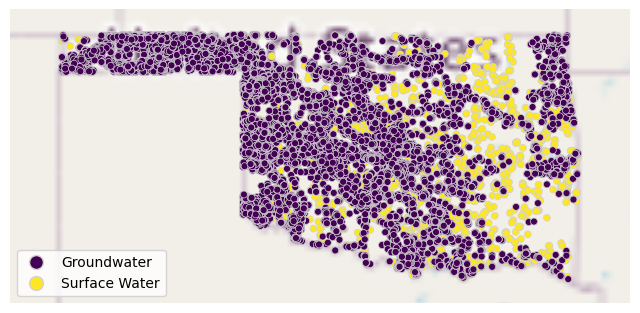

In [48]:
# ---- Map of Points sites ----

dfstemp = dfstemp_ws.copy()
dfstemp = dfstemp[dfstemp['Geometry'] == ''].reset_index(drop=True)

try:
    contiguous_usa = gpd.read_file(gplt.datasets.get_path('contiguous_usa')) # use for background map in subplot
    ax = gplt.webmap(contiguous_usa, projection=gcrs.WebMercator()) # set subplot
    gdfstemp = gpd.GeoDataFrame(dfstemp, geometry=gpd.points_from_xy(dfstemp.Longitude.astype(float), dfstemp.Latitude.astype(float)), crs="EPSG:4326")
    gplt.pointplot(gdfstemp, hue='WaterSourceTypeCV', edgecolor='lightgray', linewidth=0.5, legend=True, legend_var='hue', ax=ax)
    mplt.savefig(format="png", fname='figures/PointMap.png') 
except:
    print('No point data to plot')

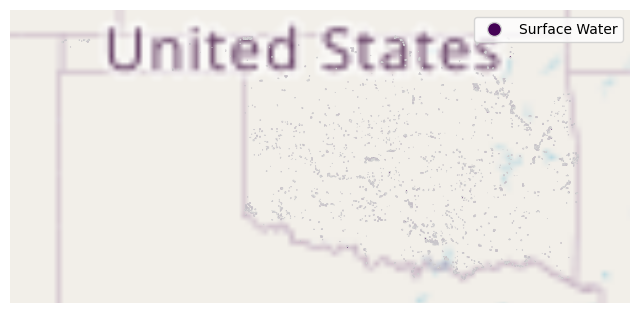

In [49]:
# ---- Map of Polygons ----

dfstemp = dfstemp_ws.copy()
dfstemp = dfstemp[dfstemp['Geometry'] != ""].reset_index(drop=True)

try:
    contiguous_usa = gpd.read_file(gplt.datasets.get_path('contiguous_usa')) # use for background map in subplot
    ax = gplt.webmap(contiguous_usa, projection=gcrs.WebMercator()) # set subplot

    dfstemp['Geometry'] = gpd.GeoSeries.from_wkt(dfstemp['Geometry'], crs="EPSG:4326")
    gdfstemp = gpd.GeoDataFrame(dfstemp, geometry=dfstemp['Geometry'], crs="EPSG:4326") # covert to geodataframe
    gplt.choropleth(gdfstemp, edgecolor='lightgray', linewidth=0.5, hue='WaterSourceTypeCV', legend=True, ax=ax)
    mplt.savefig(format="png", fname='figures/PolyMap.png')
except:
    print('No geometry data to plot')

### Allocation CFS, allocation AF, & Water Use Amount

AllocationFlow_CFS
0.00000    12972
Name: count, dtype: int64


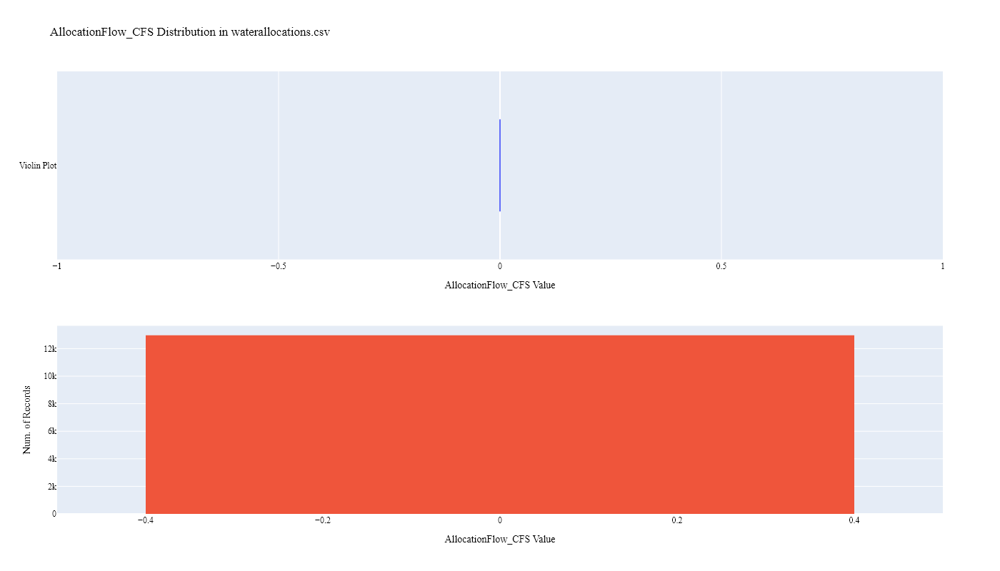

In [50]:
# ---- AllocationFlow_CFS: Boxplot distribution of WaDE values ----
print(dfaa.AllocationFlow_CFS.value_counts())

try: 
    trace1 = go.Violin(x=dfaa['AllocationFlow_CFS'], points='outliers', name='Violin Plot')
    trace2 = go.Histogram(x=dfaa['AllocationFlow_CFS'], name='Historgram')

    fig = make_subplots(rows=2, cols=1)
    fig.add_trace(trace1, row=1, col=1)
    fig.add_trace(trace2, row=2, col=1)

    fig.update_layout(width=1400, height=800, showlegend=False, bargap=0.2, title="AllocationFlow_CFS Distribution in waterallocations.csv", font=dict(family="Arial Bold", size=12,color="Black"))
    fig.update_xaxes(title_text="AllocationFlow_CFS Value", row=1, col=1)
    fig.update_xaxes(title_text="AllocationFlow_CFS Value", row=2, col=1)
    fig.update_yaxes(title_text="Num. of Records", row=2, col=1)
    fig.show(renderer="png")
    fig.write_image('figures/AllocationFlow_CFS.png', engine="kaleido")

except: print('Could not plot AllocationFlow_CFS value.')

AllocationVolume_AF
320.00000      1254
160.00000       645
640.00000       413
80.00000        373
200.00000       200
               ... 
10880.00000       1
3573.00000        1
2320.00000        1
1007.00000        1
723.00000         1
Name: count, Length: 1341, dtype: int64


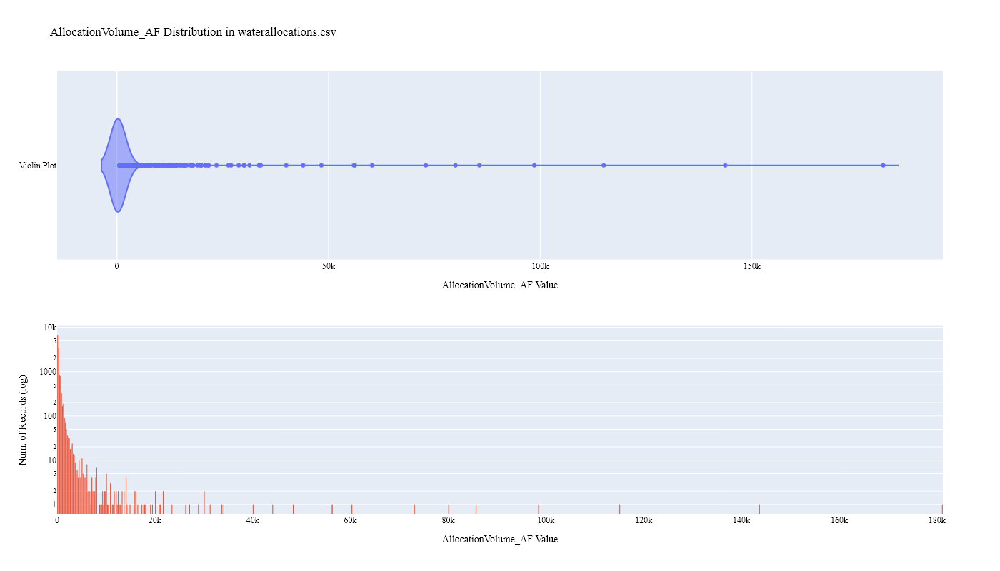

In [51]:
# ---- AllocationVolume_AF: Boxplot distribution of WaDE values ----
print(dfaa.AllocationVolume_AF.value_counts())

try:
    trace1 = go.Violin(x=dfaa['AllocationVolume_AF'], points='outliers', name='Violin Plot')
    trace2 = go.Histogram(x=dfaa['AllocationVolume_AF'], name='Historgram')

    fig = make_subplots(rows=2, cols=1)
    fig.add_trace(trace1, row=1, col=1)
    fig.add_trace(trace2, row=2, col=1)

    fig.update_layout(width=1400, height=800, showlegend=False, bargap=0.2, title="AllocationVolume_AF Distribution in waterallocations.csv", font=dict(family="Arial Bold", size=12,color="Black"))
    fig.update_xaxes(title_text="AllocationVolume_AF Value", row=1, col=1)
    fig.update_xaxes(title_text="AllocationVolume_AF Value", row=2, col=1)
    fig.update_yaxes(title_text="Num. of Records (log)", row=2, col=1, type="log")
    fig.show(renderer="png")
    fig.write_image('figures/AllocationVolume_AF.png', engine="kaleido")

except: print('Could not plot AllocationVolume_AF value.')

Amount
0.10000        3282
100.00000      3281
120.00000      3138
320.00000      2689
60.00000       2679
               ... 
56387.70000       1
67469.50000       1
58732.40000       1
1211.70000        1
791.80000         1
Name: count, Length: 9183, dtype: int64


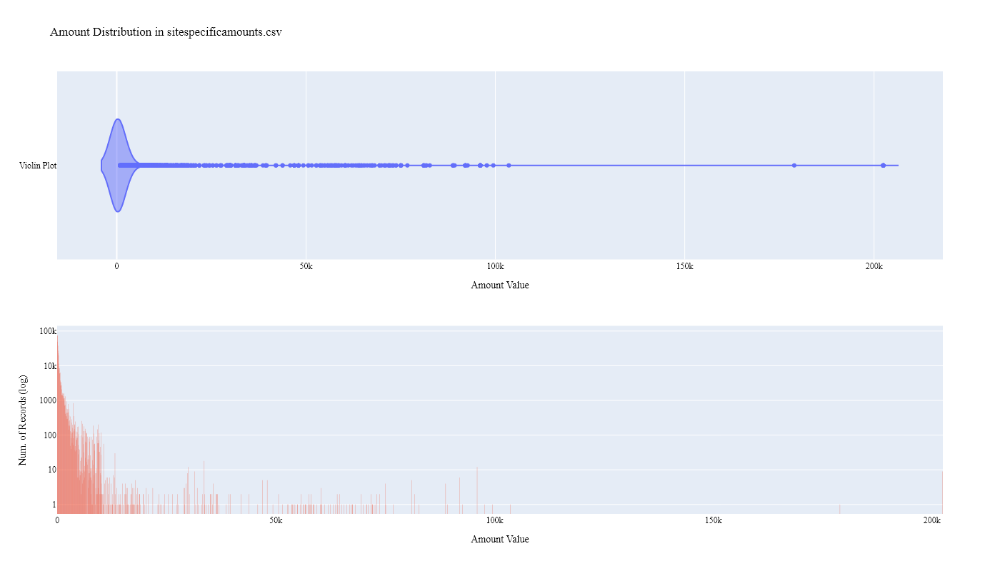

In [52]:
# ---- Amount: Boxplot distribution of WaDE values ----
print(dfsa.Amount.value_counts())

try: 
    trace1 = go.Violin(x=dfsa['Amount'], points='outliers', name='Violin Plot')
    trace2 = go.Histogram(x=dfsa['Amount'], name='Historgram')

    fig = make_subplots(rows=2, cols=1)
    fig.add_trace(trace1, row=1, col=1)
    fig.add_trace(trace2, row=2, col=1)

    fig.update_layout(width=1400, height=800, showlegend=False, bargap=0.2, title="Amount Distribution in sitespecificamounts.csv", font=dict(family="Arial Bold", size=12,color="Black"))
    fig.update_xaxes(title_text="Amount Value", row=1, col=1)
    fig.update_xaxes(title_text="Amount Value", row=2, col=1)
    fig.update_yaxes(title_text="Num. of Records (log)", row=2, col=1, type="log")
    fig.show(renderer="png")
    fig.write_image('figures/Amount.png', engine="kaleido")

except: print('Could not plot Amount value.')

# Removed Records compared to Source Data
- this is working just fine, just want to comment out temporarily for future use

In [53]:
# # Explode purge.xlsx files by WaDEUUID, concat together
# #################################################################

# # Explode watersources_missing.xlsx records by WaDEUUID
# dfwspurgeCopy = dfwspurge.assign(WaDEUUID=dfwspurge['WaDEUUID'].str.split(',')).explode('WaDEUUID').reset_index(drop=True)
# dfwspurgeCopy = dfwspurgeCopy[['WaDEUUID','ReasonRemoved','IncompleteField']]

# # Explode sites_missing.xlsx records by WaDEUUID
# dfspurgeCopy = dfspurge.assign(WaDEUUID=dfspurge['WaDEUUID'].str.split(',')).explode('WaDEUUID').reset_index(drop=True)
# dfspurgeCopy = dfspurgeCopy[['WaDEUUID','ReasonRemoved','IncompleteField']]

# # Explode waterallocations_missing.xlsx records by WaDEUUID
# dfaapurgeCopy = dfaapurge.assign(WaDEUUID=dfaapurge['WaDEUUID'].str.split(',')).explode('WaDEUUID').reset_index(drop=True)
# dfaapurgeCopy = dfaapurgeCopy[['WaDEUUID','ReasonRemoved','IncompleteField']]

# # concat purge dataframes togehter
# frames = [dfwspurgeCopy, dfspurgeCopy, dfaapurgeCopy] 
# dfWaDEUUID = pd.concat(frames)
# dfWaDEUUID = dfWaDEUUID.drop_duplicates().reset_index(drop=True).replace(np.nan, "")
# print(len(dfWaDEUUID))
# dfWaDEUUID.head(1)

# Custom Queries and Analysis for this Dataset

In [54]:
# N/A